<div style='background-color: #f0f8ff; border: 3px solid Blue;'>
    <font size="+1" color="Blue">
        <b>🚀 Notebook de Treinamento YOLO para Detecção de Armas</b>
    </font>
</div>
<div style='background-color: #fff7f7; border: 2px solid Green;'>
    <font size="+1" color="Green">
        <b>✅ Dataset configurado: dataset_final</b>
    </font>
</div>

<div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>1. Instalar bibliotecas e carregar modelo pré-treinado</b></font>
</div>

In [1]:
%pip install ultralytics --upgrade -q

import os
import torch

# Verifica GPU
print("🔍 Verificando GPU...")
if torch.cuda.is_available():
    print(f"✅ GPU detectada: {torch.cuda.get_device_name(0)}")
    print(f"✅ CUDA Version: {torch.version.cuda}")
    device = 0
else:
    print("⚠️  GPU não disponível - usando CPU")
    device = "cpu"

from ultralytics import YOLO

# Carrega modelo pré-treinado
model = YOLO("yolo11n.pt")
print("✅ Modelo YOLO11n carregado com sucesso!")


[notice] A new release of pip is available: 25.0.1 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.
🔍 Verificando GPU...
✅ GPU detectada: NVIDIA GeForce GTX 1060 6GB
✅ CUDA Version: 12.1
✅ Modelo YOLO11n carregado com sucesso!


<div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>2. Configuração do Dataset</b></font>
</div>

In [2]:
import os

# Define o diretório base e caminhos do dataset
BASE_DIR = os.getcwd()
DATASET_DIR = os.path.join(BASE_DIR, "dataset_final")
DATASET_YAML = os.path.join(DATASET_DIR, "dataset.yaml")

print(f"📁 Diretório base: {BASE_DIR}")
print(f"📁 Dataset: {DATASET_DIR}")
print(f"📄 Dataset YAML: {DATASET_YAML}")

# Verifica se o dataset existe
if os.path.exists(DATASET_YAML):
    print("✅ Dataset encontrado!")
    
    # Conta arquivos
    train_path = os.path.join(DATASET_DIR, "train", "images")
    val_path = os.path.join(DATASET_DIR, "val", "images")
    test_path = os.path.join(DATASET_DIR, "test", "images")
    
    train_images = len([f for f in os.listdir(train_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]) if os.path.exists(train_path) else 0
    val_images = len([f for f in os.listdir(val_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]) if os.path.exists(val_path) else 0
    test_images = len([f for f in os.listdir(test_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]) if os.path.exists(test_path) else 0
    
    print(f"📊 Imagens de treino: {train_images}")
    print(f"📊 Imagens de validação: {val_images}")
    print(f"📊 Imagens de teste: {test_images}")
else:
    print("❌ Dataset não encontrado! Verifique o caminho.")

📁 Diretório base: D:\Desktop\Projetos\visao
📁 Dataset: D:\Desktop\Projetos\visao\dataset_final
📄 Dataset YAML: D:\Desktop\Projetos\visao\dataset_final\dataset.yaml
✅ Dataset encontrado!
📊 Imagens de treino: 15015
📊 Imagens de validação: 4290
📊 Imagens de teste: 2146


<div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>3. Visualização dos Dados</b></font>
</div>

✅ Classes encontradas: ['Gun']
📈 Análise de dados train em processo...



C:\Users\lucas\AppData\Local\Temp\ipykernel_14852\863082479.py:132: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(cls_names)


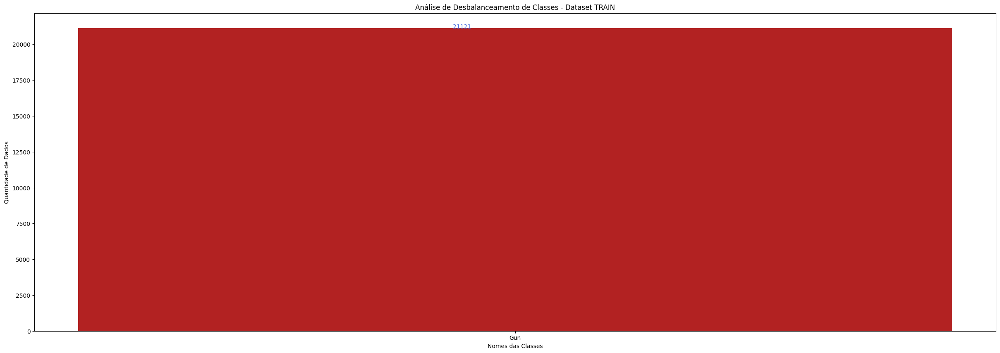

📈 Análise de dados val em processo...



C:\Users\lucas\AppData\Local\Temp\ipykernel_14852\863082479.py:132: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(cls_names)


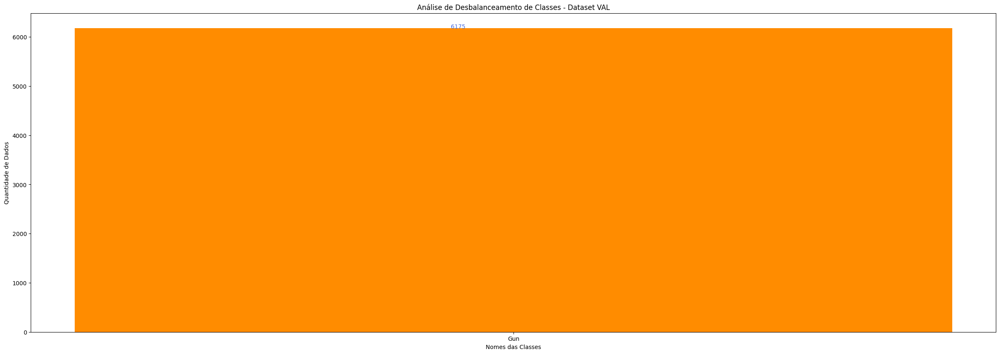

📈 Análise de dados test em processo...



C:\Users\lucas\AppData\Local\Temp\ipykernel_14852\863082479.py:132: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(cls_names)


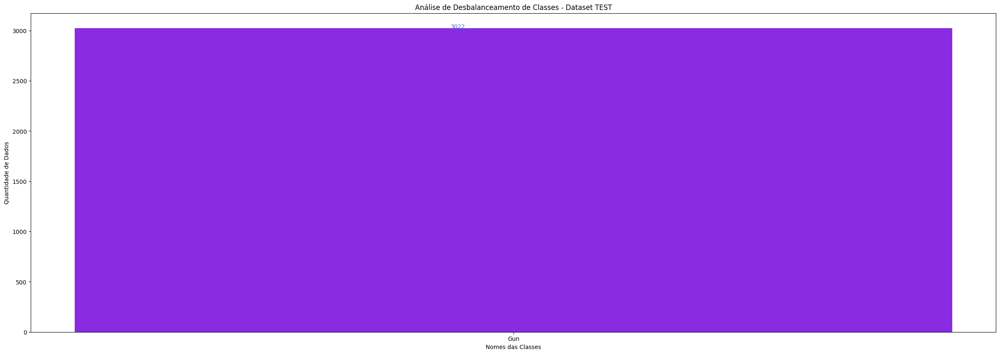

In [3]:
import cv2, yaml, random, numpy as np
from glob import glob
from PIL import Image
from matplotlib import pyplot as plt

class Visualizacao:

    def __init__(self, data_types, n_ims, rows, cmap = None):
        self.n_ims, self.rows = n_ims, rows
        self.cmap, self.data_types = cmap, data_types
        self.colors = ["firebrick", "darkorange", "blueviolet"]
        
        self.get_cls_names()
        self.get_bboxes()        
                
    def get_cls_names(self):
        # Lê o arquivo YAML do dataset
        with open(DATASET_YAML, 'r', encoding='utf-8') as file:
            data = yaml.safe_load(file)
        
        # Extrai nomes das classes
        class_names = data['names']
        
        # Cria dicionário com índice como chave e nome da classe como valor
        self.class_dict = {index: name for index, name in enumerate(class_names)}
        print(f"✅ Classes encontradas: {list(self.class_dict.values())}")
    
    def get_bboxes(self):
        self.vis_datas, self.analysis_datas, self.im_paths = {}, {}, {}
        
        for data_type in self.data_types:
            all_bboxes, all_analysis_datas = [], {}
            # Busca imagens no dataset
            im_paths = glob(os.path.join(DATASET_DIR, data_type, "images", "*"))
            im_paths = [p for p in im_paths if p.lower().endswith(('.jpg', '.jpeg', '.png'))]
            
            for idx, im_path in enumerate(im_paths):
                bboxes = []
                # Encontra o arquivo de label correspondente
                lbl_path = im_path.replace("images", "labels")
                for ext in ['.jpg', '.jpeg', '.JPG', '.JPEG', '.png', '.PNG']:
                    lbl_path = lbl_path.replace(ext, ".txt")
                
                if not os.path.isfile(lbl_path):
                    continue
                    
                meta_data = open(lbl_path, 'r').readlines()
                for data in meta_data:
                    # Divide a string por espaço e remove quebra de linha
                    parts = data.strip().split()[:5]
                    if len(parts) < 5:
                        continue
                    cls_name = self.class_dict[int(parts[0])]
                    # Converte primeiro elemento para inteiro e o resto para float
                    bboxes.append([cls_name] + [float(x) for x in parts[1:]])
                    if cls_name not in all_analysis_datas:
                        all_analysis_datas[cls_name] = 1
                    else:
                        all_analysis_datas[cls_name] += 1
                all_bboxes.append(bboxes)
                    
            self.vis_datas[data_type] = all_bboxes
            self.analysis_datas[data_type] = all_analysis_datas
            self.im_paths[data_type] = im_paths
    
    def plot(self, rows, cols, count, im_path, bboxes):
        plt.subplot(rows, cols, count)
        or_im = np.array(Image.open(im_path).convert("RGB"))
        height, width, _ = or_im.shape

        for bbox in bboxes:
            class_id, x_center, y_center, w, h = bbox

            # Converte formato YOLO para valores de pixel
            x_min = int((x_center - w / 2) * width)
            y_min = int((y_center - h / 2) * height)
            x_max = int((x_center + w / 2) * width)
            y_max = int((y_center + h / 2) * height)
            
            color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
            cv2.rectangle(img=or_im, pt1=(x_min, y_min), pt2=(x_max, y_max), color=color, thickness=3)
        
        plt.imshow(or_im)
        plt.axis("off")
        plt.title(f"Há {len(bboxes)} objeto(s) na imagem.")
        
        return count + 1

    def vis(self, save_name):
        print(f"📊 Visualização de dados {save_name.upper()} em processo...\n")
        assert self.cmap in ["rgb", "gray"], "Por favor escolha rgb ou gray cmap"
        if self.cmap == "rgb":
            cmap = "viridis"
        cols = self.n_ims // self.rows
        count = 1
        
        plt.figure(figsize=(25, 20))
        
        if len(self.vis_datas[save_name]) == 0:
            print(f"⚠️  Nenhuma imagem encontrada para {save_name}")
            return
            
        indices = [random.randint(a=0, b=len(self.vis_datas[save_name]) - 1) for _ in range(min(self.n_ims, len(self.vis_datas[save_name])))]

        for idx, index in enumerate(indices):
            if count == self.n_ims + 1:
                break
            
            im_path = self.im_paths[save_name][index]
            bboxes = self.vis_datas[save_name][index]

            count = self.plot(self.rows, cols, count, im_path=im_path, bboxes=bboxes)
            
        plt.show()

    def data_analysis(self, save_name, color):
        print(f"📈 Análise de dados {save_name} em processo...\n")
        
        if save_name not in self.analysis_datas or len(self.analysis_datas[save_name]) == 0:
            print(f"⚠️  Nenhum dado encontrado para {save_name}")
            return
        
        width, text_width, text_height = 0.7, 0.05, 2
        cls_names = list(self.analysis_datas[save_name].keys())
        counts = list(self.analysis_datas[save_name].values())
        
        _, ax = plt.subplots(figsize=(30, 10))
        indices = np.arange(len(counts))

        ax.bar(indices, counts, width, color=color)
        ax.set_xlabel("Nomes das Classes", color="black")
        ax.set_xticklabels(cls_names)
        ax.set(xticks=indices, xticklabels=cls_names)
        ax.set_ylabel("Quantidade de Dados", color="black")
        ax.set_title(f"Análise de Desbalanceamento de Classes - Dataset {save_name.upper()}")

        for i, v in enumerate(counts):
            ax.text(i - text_width, v + text_height, str(v), color="royalblue")
        plt.show()
    
    def visualization(self):
        [self.vis(save_name) for save_name in self.data_types]
        
    def analysis(self):
        [self.data_analysis(save_name, color) for (save_name, color) in zip(self.data_types, self.colors)]
        
# Cria visualização
vis = Visualizacao(data_types=["train", "val", "test"], n_ims=20, rows=5, cmap="rgb")
vis.analysis()

📊 Visualização de dados TRAIN em processo...



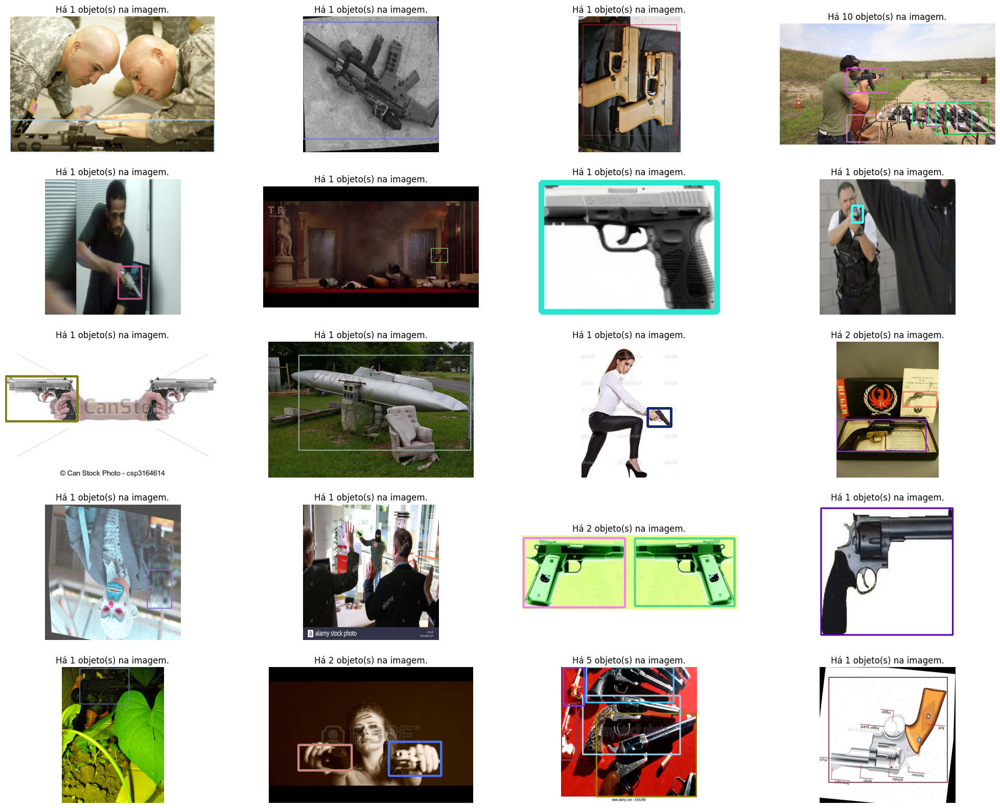

📊 Visualização de dados VAL em processo...



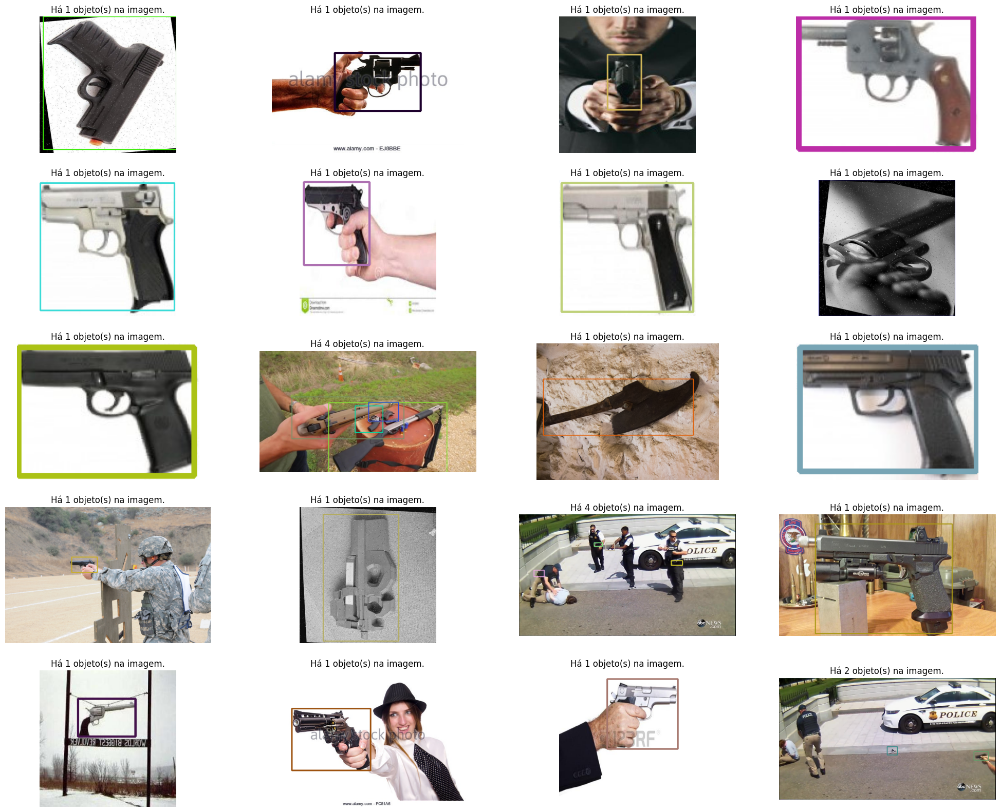

📊 Visualização de dados TEST em processo...



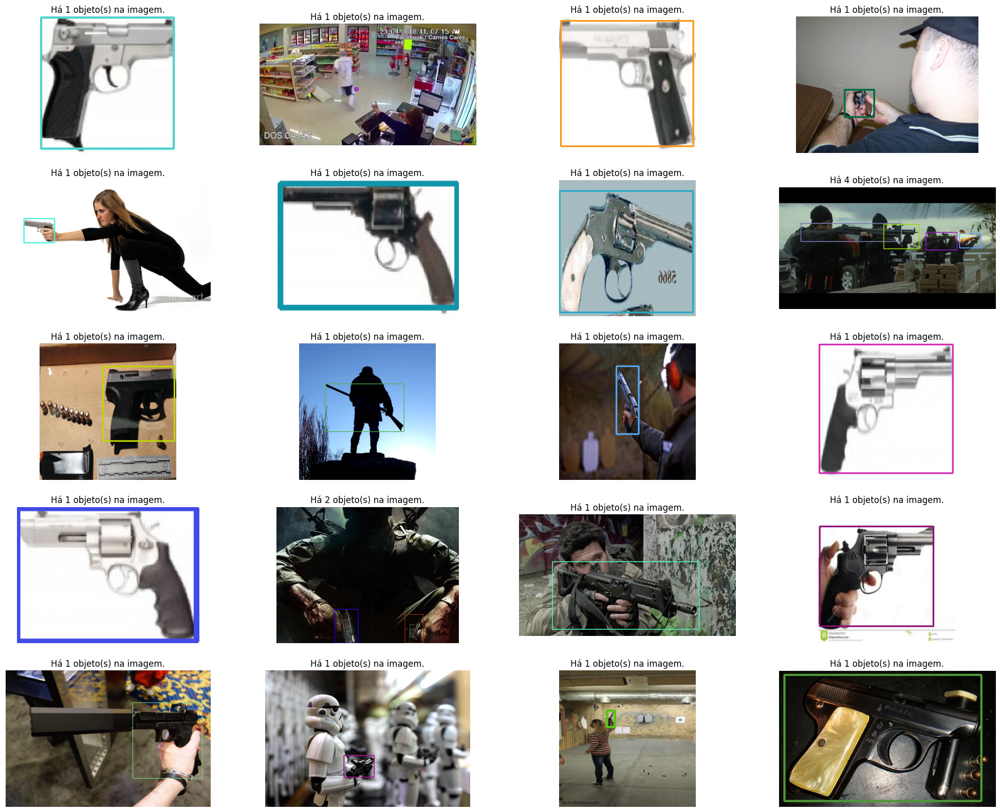

In [4]:
# Visualiza imagens com bounding boxes
vis.visualization()

<div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>4. Treinamento do Modelo</b></font>
</div>

## 

In [6]:
import time
from datetime import datetime

# Registra tempo de início
start_time = time.time()
print(f"🚀 Iniciando treinamento às {datetime.now().strftime('%H:%M:%S')}")
if device == 0:
    print("🚀 Usando GPU - treinamento será muito mais rápido!")
else:
    print("⚠️  Usando CPU - treinamento será MUITO lento!")

# Treina o modelo
train_results = model.train(
    data=DATASET_YAML,  # caminho para o dataset YAML
    epochs=100,
    imgsz=480,
    device=device,
)

# Calcula tempo total
end_time = time.time()
total_time = end_time - start_time
hours = int(total_time // 3600)
minutes = int((total_time % 3600) // 60)
seconds = int(total_time % 60)
print(f"\n✅ Treinamento concluído em {hours}h {minutes}m {seconds}s")

🚀 Iniciando treinamento às 03:14:28
🚀 Usando GPU - treinamento será muito mais rápido!
Ultralytics 8.3.226  Python-3.13.9 torch-2.7.1+cu118 CUDA:0 (NVIDIA GeForce GTX 1060 6GB, 6144MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=D:\Desktop\Projetos\visao\dataset_final\dataset.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=480, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train6, nbs=6

<div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>5. Curvas de Aprendizado</b></font>
</div>

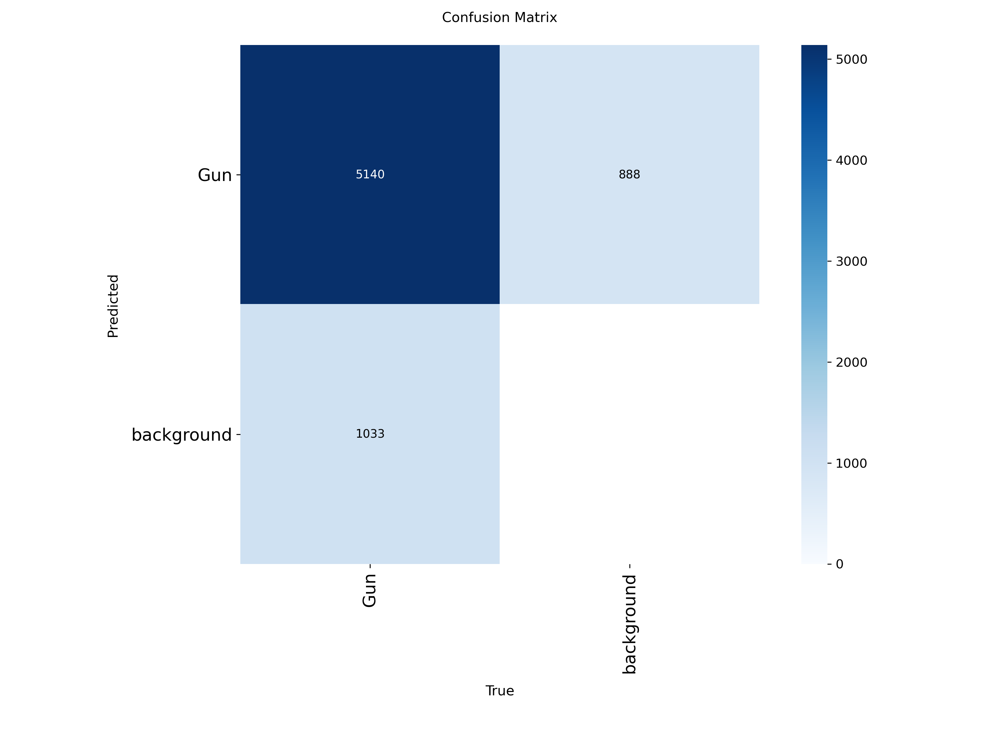

In [7]:
# Matriz de Confusão
from PIL import Image

# Encontra o diretório de treinamento mais recente
runs_dir = "runs/detect"
if os.path.exists(runs_dir):
    train_dirs = [d for d in os.listdir(runs_dir) if d.startswith("train")]
    if train_dirs:
        latest_train = sorted(train_dirs)[-1]
        confusion_path = os.path.join(runs_dir, latest_train, "confusion_matrix.png")
        if os.path.exists(confusion_path):
            display(Image.open(confusion_path))
        else:
            print(f"⚠️  Arquivo não encontrado: {confusion_path}")
    else:
        print("⚠️  Nenhum diretório de treinamento encontrado")
else:
    print("⚠️  Diretório runs/detect não encontrado. Execute o treinamento primeiro.")

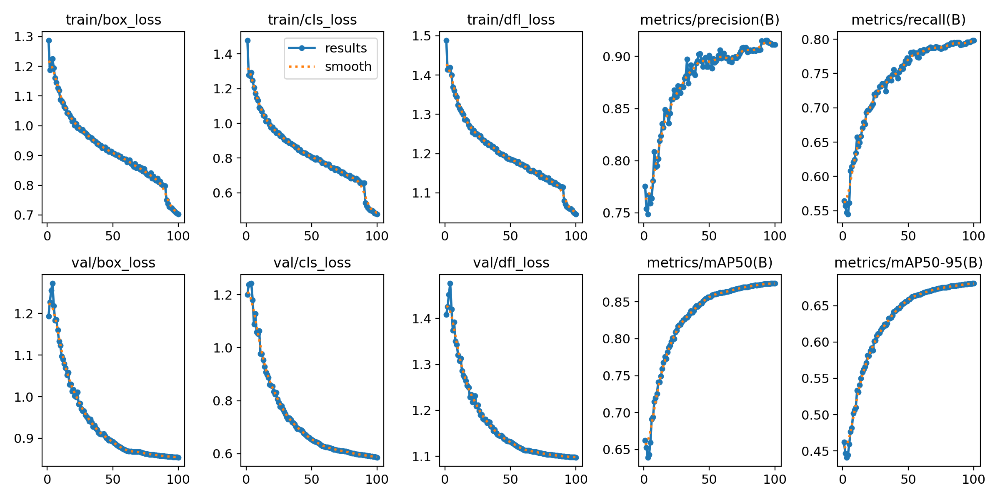

In [8]:
# Gráfico de Resultados (Losses e Métricas)
if os.path.exists(runs_dir):
    train_dirs = [d for d in os.listdir(runs_dir) if d.startswith("train")]
    if train_dirs:
        latest_train = sorted(train_dirs)[-1]
        results_path = os.path.join(runs_dir, latest_train, "results.png")
        if os.path.exists(results_path):
            display(Image.open(results_path))
        else:
            print(f"⚠️  Arquivo não encontrado: {results_path}")

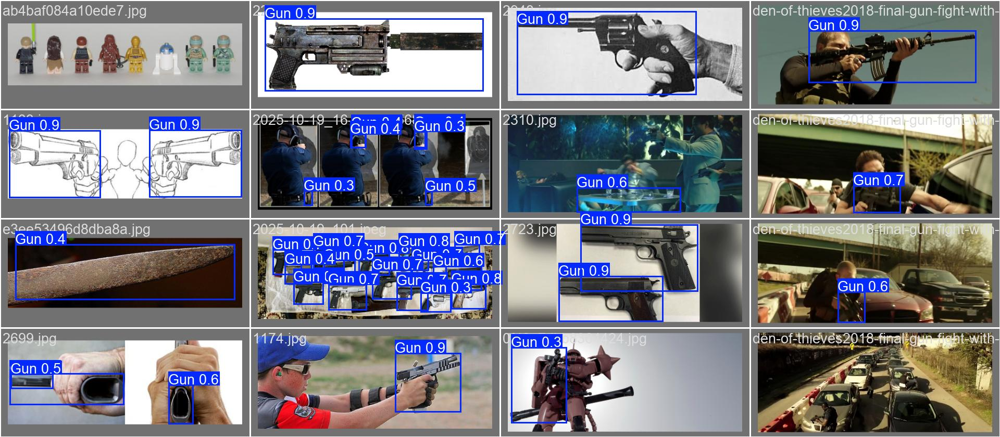

In [11]:
# Visualização de Predições na Validação
if os.path.exists(runs_dir):
    train_dirs = [d for d in os.listdir(runs_dir) if d.startswith("train")]
    if train_dirs:
        latest_train = sorted(train_dirs)[-1]
        val_pred_path = os.path.join(runs_dir, latest_train, "val_batch0_pred.jpg")
        if os.path.exists(val_pred_path):
            display(Image.open(val_pred_path))
        else:
            print(f"⚠️  Arquivo não encontrado: {val_pred_path}")

<div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>6. Inferência com Dataset de Teste</b></font>
</div>

In [3]:
# Carrega o melhor modelo treinado
runs_dir = "runs/detect"
if os.path.exists(runs_dir):
    train_dirs = [d for d in os.listdir(runs_dir) if d.startswith("train")]
    if train_dirs:
        latest_train = sorted(train_dirs)[-1]
        best_model_path = os.path.join(runs_dir, latest_train, "weights", "best.pt")
        if os.path.exists(best_model_path):
            print(f"✅ Carregando melhor modelo: {best_model_path}")
            best_model = YOLO(best_model_path)
        else:
            print("⚠️  Melhor modelo não encontrado, usando modelo atual")
            best_model = model
    else:
        best_model = model
else:
    best_model = model

# Executa inferência no dataset de teste
test_images_path = os.path.join(DATASET_DIR, "test", "images")
print(f"🔍 Executando inferência em: {test_images_path}")

inference_results = best_model(test_images_path, device=device)
print(f"✅ Inferência concluída em {len(inference_results)} imagens")

✅ Carregando melhor modelo: runs/detect\train6\weights\best.pt
🔍 Executando inferência em: D:\Desktop\Projetos\visao\dataset_final\test\images

WARNING 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/2146 D:\Desktop\Projetos\visao\dataset_final\test\images\00020.jpg: 480x480 2 Guns, 13.1ms
image 2/2146 D:\Desktop\Projetos\visao\dataset_final\test\images\00024.jpg: 480x480 1 Gun, 11.9ms
image 3/2146 D:\Desktop\Projetos\visao\dataset_final\test\images\0003.jpg: 480x480 1 Gun, 14.3ms
image 4/2146 D:\Deskto

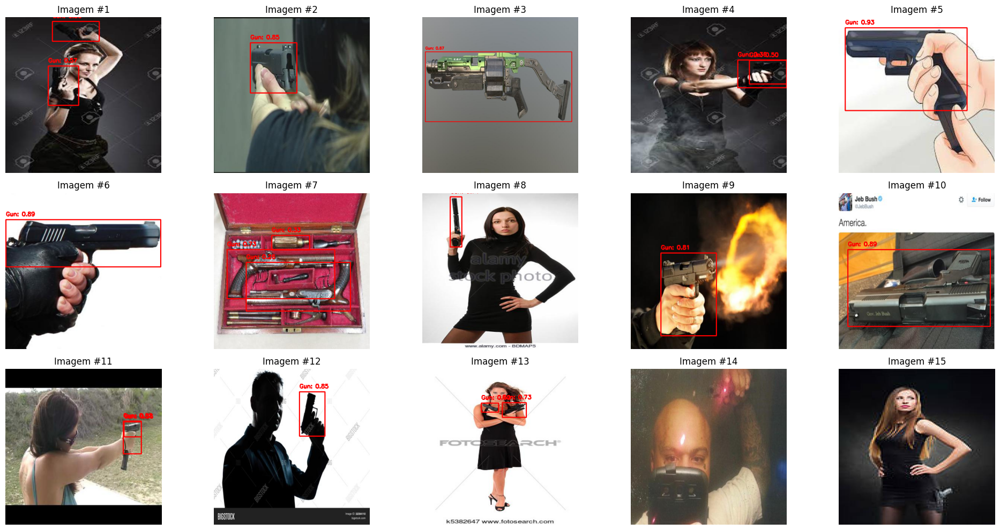

In [13]:
def visualizar_inferencia(res, n_ims, rows):
    """Visualiza resultados da inferência"""
    cols = n_ims // rows
    plt.figure(figsize=(20, 10))
    
    for idx, r in enumerate(res):
        if idx >= n_ims:
            break
        plt.subplot(rows, cols, idx + 1)
        or_im_rgb = np.array(Image.open(r.path).convert("RGB"))
        
        # Desenha bounding boxes
        for i in r:
            for bbox in i.boxes:
                box = bbox.xyxy[0]
                x1, y1, x2, y2 = box
                coord1, coord2 = (int(x1), int(y1)), (int(x2), int(y2))
                conf = bbox.conf[0]
                cls = int(bbox.cls[0])
                
                # Desenha retângulo
                cv2.rectangle(or_im_rgb, coord1, coord2, color=(255, 0, 0), thickness=2)
                
                # Adiciona label com confiança
                label = f"{best_model.names[cls]}: {conf:.2f}"
                cv2.putText(or_im_rgb, label, (int(x1), int(y1) - 10),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)
        
        plt.imshow(or_im_rgb)
        plt.title(f"Imagem #{idx + 1}")
        plt.axis("off")
    
    plt.tight_layout()
    plt.show()

# Visualiza resultados
visualizar_inferencia(res=inference_results, n_ims=15, rows=3)

In [14]:
# Define o caminho do dataset
base_dir = os.getcwd()
dataset_yaml = os.path.join(base_dir, "dataset_final", "dataset.yaml")

val_metrics = model.val(
    data=dataset_yaml,
    split='test'
)
val_metrics.summary()

Ultralytics 8.3.226  Python-3.13.9 torch-2.7.1+cu118 CUDA:0 (NVIDIA GeForce GTX 1060 6GB, 6144MiB)
YOLO11n summary (fused): 100 layers, 2,582,347 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 3.51.5 MB/s, size: 55.8 KB)
val: Scanning D:\Desktop\Projetos\visao\dataset_final\test\labels... 2146 images, 1 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 2146/2146 250.9it/s 8.6s<0.0s
val: New cache created: D:\Desktop\Projetos\visao\dataset_final\test\labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 135/135 7.6it/s 17.8s0.2s
                   all       2146       3022       0.91      0.811      0.883      0.686
Speed: 0.6ms preprocess, 3.9ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to D:\Desktop\Projetos\visao\runs\detect\val


[{'Class': 'Gun',
  'Images': np.int64(2145),
  'Instances': np.int64(3022),
  'Box-P': np.float64(0.90979),
  'Box-R': np.float64(0.81093),
  'Box-F1': np.float64(0.85752),
  'mAP50': np.float64(0.8834),
  'mAP50-95': np.float64(0.68607)}]

In [15]:
# 📊 RESUMO E EXPLICAÇÃO DOS RESULTADOS
print("="*70)
print("📊 RESUMO E EXPLICAÇÃO DOS RESULTADOS DO TREINAMENTO")
print("="*70)

# Encontra o melhor modelo treinado
runs_dir = "runs/detect"
if os.path.exists(runs_dir):
    train_dirs = [d for d in os.listdir(runs_dir) if d.startswith("train")]
    if train_dirs:
        latest_train = sorted(train_dirs)[-1]
        best_model_path = os.path.join(runs_dir, latest_train, "weights", "best.pt")
        
        if os.path.exists(best_model_path):
            best_model = YOLO(best_model_path)
            
            # Valida no conjunto de teste
            print("\n🔍 Executando validação no conjunto de teste...")
            test_metrics = best_model.val(data=DATASET_YAML, split='test', device=device)
            
            # Extrai métricas
            metrics = test_metrics.results_dict
            
            precision = metrics.get('metrics/precision(B)', 0)
            recall = metrics.get('metrics/recall(B)', 0)
            map50 = metrics.get('metrics/mAP50(B)', 0)
            map50_95 = metrics.get('metrics/mAP50-95(B)', 0)
            
            print("\n" + "="*70)
            print("📈 MÉTRICAS DE DESEMPENHO")
            print("="*70)
            
            # Precision
            print(f"\n1️⃣  PRECISION (P): {precision:.3f} ({precision*100:.1f}%)")
            print("   📝 O que é: Quando o modelo diz que tem arma, está certo?")
            print("   📊 Cálculo: TP / (TP + FP)")
            print("   ✅ Interpretação: ", end="")
            if precision > 0.90:
                print("✅ EXCELENTE - Muito poucos falsos positivos!")
            elif precision > 0.85:
                print("✅ MUITO BOM - Poucos falsos positivos")
            elif precision > 0.75:
                print("⚠️  BOM - Alguns falsos positivos")
            else:
                print("❌ PODE MELHORAR - Muitos falsos positivos")
            
            # Recall
            print(f"\n2️⃣  RECALL (R): {recall:.3f} ({recall*100:.1f}%)")
            print("   📝 O que é: Das armas reais, quantas o modelo encontrou?")
            print("   📊 Cálculo: TP / (TP + FN)")
            print("   ✅ Interpretação: ", end="")
            if recall > 0.85:
                print("✅ EXCELENTE - Encontra quase todas as armas!")
            elif recall > 0.80:
                print("✅ MUITO BOM - Encontra a maioria das armas")
            elif recall > 0.70:
                print("⚠️  BOM - Encontra muitas, mas perde algumas")
            else:
                print("❌ PODE MELHORAR - Perde muitas armas reais")
            
            # mAP50
            print(f"\n3️⃣  mAP50: {map50:.3f} ({map50*100:.1f}%)")
            print("   📝 O que é: Desempenho geral considerando IoU ≥ 0.50")
            print("   📊 Cálculo: Média da área sob curva Precision-Recall (IoU ≥ 0.50)")
            print("   ✅ Interpretação: ", end="")
            if map50 > 0.85:
                print("✅ EXCELENTE - Desempenho muito forte!")
            elif map50 > 0.80:
                print("✅ MUITO BOM - Desempenho forte")
            elif map50 > 0.70:
                print("⚠️  BOM - Desempenho razoável")
            else:
                print("❌ PODE MELHORAR - Desempenho abaixo do esperado")
            
            # mAP50-95
            print(f"\n4️⃣  mAP50-95: {map50_95:.3f} ({map50_95*100:.1f}%)")
            print("   📝 O que é: Desempenho geral considerando IoU 0.50-0.95 (mais rigoroso)")
            print("   📊 Cálculo: Média dos mAPs em múltiplos limiares de IoU")
            print("   ✅ Interpretação: ", end="")
            if map50_95 > 0.75:
                print("✅ EXCELENTE - Caixas muito precisas!")
            elif map50_95 > 0.65:
                print("✅ MUITO BOM - Caixas bem precisas")
            elif map50_95 > 0.55:
                print("⚠️  BOM - Caixas razoáveis, mas podem melhorar")
            else:
                print("❌ PODE MELHORAR - Caixas não muito precisas")
            
            # Análise geral
            print("\n" + "="*70)
            print("🎯 ANÁLISE GERAL")
            print("="*70)
            
            # Pontos fortes
            print("\n✅ PONTOS FORTES:")
            if precision > 0.90:
                print("   • Alta precisão - modelo é muito confiável")
            if map50 > 0.85:
                print("   • Excelente mAP50 - encontra bem os objetos")
            if recall > 0.75:
                print("   • Bom recall - encontra a maioria das armas")
            
            # Pontos de melhoria
            print("\n⚠️  PONTOS DE MELHORIA:")
            if recall < 0.85:
                print(f"   • Recall pode melhorar (atual: {recall*100:.1f}%, ideal: >85%)")
            if map50_95 < map50 * 0.85:
                print("   • mAP50-95 pode melhorar - caixas podem ser mais precisas")
            if precision < 0.90:
                print("   • Precision pode melhorar - reduzir falsos positivos")
            
            # Recomendações
            print("\n💡 RECOMENDAÇÕES:")
            if recall < 0.85:
                print("   • Reduzir threshold de confiança (conf=0.15)")
                print("   • Aumentar data augmentation")
                print("   • Treinar mais épocas se as perdas ainda estiverem caindo")
            if map50_95 < 0.70:
                print("   • Ajustar hiperparâmetros de regressão de caixa")
                print("   • Melhorar qualidade das anotações")
            if precision < 0.90:
                print("   • Aumentar threshold de confiança")
                print("   • Revisar anotações para garantir qualidade")
            
            # Resumo final
            print("\n" + "="*70)
            print("📊 RESUMO FINAL")
            print("="*70)
            print(f"✅ Precision: {precision*100:.1f}% - {'Excelente' if precision > 0.90 else 'Bom'}")
            print(f"✅ Recall: {recall*100:.1f}% - {'Excelente' if recall > 0.85 else 'Bom'}")
            print(f"✅ mAP50: {map50*100:.1f}% - {'Excelente' if map50 > 0.85 else 'Bom'}")
            print(f"✅ mAP50-95: {map50_95*100:.1f}% - {'Excelente' if map50_95 > 0.75 else 'Bom'}")
            
            print("\n🎯 CONCLUSÃO:")
            if map50 > 0.85 and recall > 0.80:
                print("   ✅ Modelo está com BOM desempenho e pronto para uso!")
            elif map50 > 0.80:
                print("   ⚠️  Modelo está BOM, mas pode melhorar com ajustes")
            else:
                print("   ❌ Modelo precisa de mais treinamento ou ajustes")
            
            print("="*70)
        else:
            print("⚠️  Melhor modelo não encontrado. Execute o treinamento primeiro.")
    else:
        print("⚠️  Nenhum treinamento encontrado. Execute o treinamento primeiro.")
else:
    print("⚠️  Diretório de resultados não encontrado. Execute o treinamento primeiro.")

📊 RESUMO E EXPLICAÇÃO DOS RESULTADOS DO TREINAMENTO

🔍 Executando validação no conjunto de teste...
Ultralytics 8.3.226  Python-3.13.9 torch-2.7.1+cu118 CUDA:0 (NVIDIA GeForce GTX 1060 6GB, 6144MiB)
YOLO11n summary (fused): 100 layers, 2,582,347 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 8.913.8 MB/s, size: 126.2 KB)
val: Scanning D:\Desktop\Projetos\visao\dataset_final\test\labels.cache... 2146 images, 1 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 2146/2146 2.8Mit/s 0.0s0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 135/135 6.7it/s 20.1s0.1s
                   all       2146       3022       0.91      0.811      0.883      0.686
Speed: 0.8ms preprocess, 3.8ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to D:\Desktop\Projetos\visao\runs\detect\val2

📈 MÉTRICAS DE DESEMPENHO

1️⃣  PRECISION (P): 0.910 (91.0%)
   📝 O que é: Quando o modelo diz que tem arma, está cer